In [0]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

#Anomaly Detection Model
Uses an autoencoder neural network and distrete wavelet transform to perform unsupervised anomaly
detection of disaggregated appliance load.

###Create functions to load house data, extract sequences, select appliance midpoints, and create autoencoder model



In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from sklearn.preprocessing import StandardScaler
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, MaxPooling1D 
from keras.layers import BatchNormalization, AveragePooling1D, UpSampling1D
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping


# Import house_key.py file which serves as a lookup table for id, and appliance number
house_key = drive.CreateFile({'id':'1mlx9QROP7yD_P-Gt3kXx0oWksJImQQjW'})
house_key.GetContentFile('house_key.py')
import house_key

house_info = house_key.make_house_info()

def import_house_data(selected_houses, appliance, house_info):
  '''Import raw house data from Drive. Resample to 1 minute intervals.
     Extract the aggregate and target appliance columns and place in
     a dataframe. Append each house to the end of the previous df.'''
  df = pd.DataFrame(columns = ['Aggregate', 'Appliance'])
  for house in selected_houses:
    id = house_info[house]['id']
    downloaded = drive.CreateFile({'id':id}) 
    downloaded.GetContentFile(f'house{house}.csv')
    house_df = pd.read_csv(f'house{house}.csv', parse_dates=['Time'], index_col='Time').drop(['Unix', 'Issues'], axis = 1).resample('min').mean()
    house_df = house_df[['Aggregate', house_info[house][appliance]]].dropna()
    house_df.rename(columns={house_info[house][appliance]:'Appliance'}, inplace=True)
    df = df.append(house_df, sort = False)
  return df  

def make_scaled_sequences(df, n_steps):
  """Creates list of sequences of length n_steps
     that walks forward one timestep at a time"""
  stdsc = StandardScaler()
  X = stdsc.fit_transform(df[['Appliance']])
  input_list = list(X)
  output_list = []
  for i in range(len(input_list)):
    end_ix = i + n_steps
    if end_ix > len(input_list):
      break
    seq = input_list[i:end_ix]
    output_list.append(seq)
  X = np.array(output_list) 
  X = X.reshape(X.shape[0], X.shape[1], 1)
  return X

def make_sequences(df, n_steps):
  """Creates list of sequences of length n_steps
     that walks forward one timestep at a time"""
  input_list = list(df['Appliance'])
  output_list = []
  for i in range(len(input_list)):
    end_ix = i + n_steps
    if end_ix > len(input_list):
      break
    seq = input_list[i:end_ix]
    output_list.append(seq)
  X = np.array(output_list) 
  X = X.reshape(X.shape[0], X.shape[1], 1)
  return X
    
def get_next_point(df, n_steps):
  '''Gets one point ahead of a sliding sequence'''
  df = df.iloc[:, 1] #Select first column to get appliance data
  df_ = df[n_steps:len(df)+1]
  y = np.array(df)
  return y
  
def create_model(n_steps):
  '''Builds autoencoder model'''
  model = Sequential()
  model.add(Conv1D(16, kernel_size=6, strides =1, activation='relu', input_shape=(n_steps, 1), padding = 'same'))
  model.add(BatchNormalization())

  model.add(Conv1D(8, kernel_size=4, strides = 1, activation='relu', padding = 'same'))
  model.add(BatchNormalization())
  model.add(AveragePooling1D(pool_size =2, strides =2))

  model.add(Dense(n_steps*8, activation = 'relu'))
  model.add(BatchNormalization())
  model.add(AveragePooling1D(pool_size =2, strides =2))

  model.add(Dense(128, activation = 'relu'))
  model.add(BatchNormalization())
  model.add(UpSampling1D(size =2))

  model.add(Dense(n_steps*8, activation = 'relu'))
  model.add(BatchNormalization())
  model.add(UpSampling1D(size =2))

  model.add(Conv1D(8, kernel_size=4, strides = 1, activation='relu', padding = 'same'))
  model.add(BatchNormalization())

  model.add(Conv1D(16, kernel_size=4, strides = 1, activation='sigmoid', padding = 'same'))
  
  model.add(Dense(1, activation = 'relu'))
  model.add(BatchNormalization())

  adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=0.00000008, decay=0.0, amsgrad=False)

  model.compile(loss='mse', optimizer=adam, metrics=['mae'])
  
  print(model.summary())
  return model

Using TensorFlow backend.
W0805 17:41:40.316481 139711213909888 __init__.py:44] file_cache is unavailable when using oauth2client >= 4.0.0 or google-auth
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/__init__.py", line 36, in autodetect
    from google.appengine.api import memcache
ModuleNotFoundError: No module named 'google.appengine'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 33, in <module>
    from oauth2client.contrib.locked_file import LockedFile
ModuleNotFoundError: No module named 'oauth2client.contrib.locked_file'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 37, in <module>
    from oauth2clie

### Specify target appliance and training/test houses. Import data for selected houses
For anomaly detection autoencoder, we import dishwasher data from several houses


In [0]:
appliance = 'Dishwasher'   # must be a string with first letters capitalized
house = [1,2,3,6,7,9,10,11,13,15]        # must be a list with an integer            
n_steps = 32               # length of sliding window. Should be an odd number

# Imports house data for target appliance and places in dataframes
df = import_house_data(house, appliance, house_info)

### Build Model

In [0]:
model = create_model(n_steps)

W0805 17:47:36.355725 139711213909888 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0805 17:47:36.375769 139711213909888 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0805 17:47:36.379049 139711213909888 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0805 17:47:36.484292 139711213909888 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:133: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0805 17:47:36.627143 

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 32, 16)            112       
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 16)            64        
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 32, 8)             520       
_________________________________________________________________
batch_normalization_2 (Batch (None, 32, 8)             32        
_________________________________________________________________
average_pooling1d_1 (Average (None, 16, 8)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 16, 256)           2304      
_________________________________________________________________
batch_normalization_3 (Batch (None, 16, 256)           1024      
__________

###Create training and target sequences

In [0]:
X = make_scaled_sequences(df, n_steps) # Input sequence uses a StandardScaler
y = X

## ***REQUIRES INPUT*** Define number of epochs and batch size.  Fit model

In [0]:
batch_size = 1000
epochs = 50

early_stop = EarlyStopping(monitor='mean_absolute_error', min_delta=0.1, patience=3, verbose=0, mode='auto', baseline=None, restore_best_weights=False)
history = model.fit(X, y, batch_size = batch_size, epochs = epochs, verbose=1, callbacks = [early_stop])

model.save('dw_anomaly_detector.h5')

Epoch 1/50
6938348/6938348 [==============================] - 369s 53us/step - loss: 0.0059 - mean_absolute_error: 0.0270
Epoch 2/50
6938348/6938348 [==============================] - 368s 53us/step - loss: 0.0017 - mean_absolute_error: 0.0241
Epoch 3/50
6938348/6938348 [==============================] - 370s 53us/step - loss: 0.0013 - mean_absolute_error: 0.0228
Epoch 4/50
6938348/6938348 [==============================] - 368s 53us/step - loss: 0.0011 - mean_absolute_error: 0.0222


###Plot model loss (MSE)

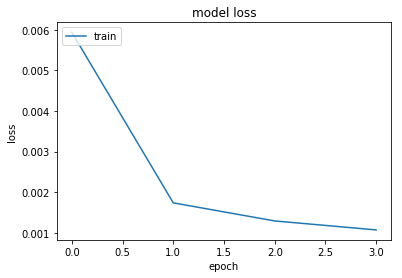

<Figure size 432x288 with 0 Axes>

In [0]:
plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
plt.savefig('model_loss.png')

### Import disaggregated appliance data
Used house 2 dishwasher for this test

In [0]:
dw = pd.read_csv('dw_house2.csv', index_col='Time', parse_dates=True, names = ['Time','Appliance'], header = 1)

### Create a list of sequences of length n_steps

In [0]:
X_dw = make_scaled_sequences(dw, n_steps = 32)

### Reconstruct appliance load

Trained model attempts to recreate the input sequence. 

In [0]:
y_dw = model.predict(X_dw)

### Create Functions for Discrete Wavelet Anomaly Detection

In [0]:
import pywt

def calculate_wavelet_mse(input_seqs, output_seqs):
    """Calculates haar discrete wavelet transform coefficients for each input sequence."""
    coef_in = []
    for i in input_seqs:
        cA, cB = pywt.dwt(i, 'haar', 'smooth')
        coef_in.append(cA)
    coef_out = []
    for j in output_seqs:
        cC, cD = pywt.dwt(j, 'haar', 'smooth')
        coef_out.append(cC)
    return coef_in, coef_out
 
def calculate_rmse(coef_in, coef_out, n_steps):
    """Calculates the mean squared error between the discrete wavelt coefficients of two sequences"""
    mse_tot = []
    for i in range(len(coef_in)):
        mse_seq = 0
        for j in range(n_steps//2):
            x = np.sqrt((coef_in[i][j] - coef_out[i][j])**2)
            mse_seq += x
        mse_tot.append(mse_seq)
    return np.round(mse_tot,2)
  
def detect_anomalies(mse, threshold, n_steps):
    """Labels each sequence as a 1 or 0 based on whether the mse is above a specified threshold.
       For each 1 label, calculates the start and end index of the anomaly sequence."""
    anomaly_list = []
    for i in mse:
        if i > threshold:
            anomaly_list.append(1)
        else:
            anomaly_list.append(0)
    anomaly_ranges = [(i, i+n_steps) for i in range(len(anomaly_list)) if anomaly_list[i] == 1]
    return anomaly_ranges

### Calculate discrete wavelet transform coefficients

In [0]:
coef_in, coef_out = calculate_wavelet_mse(X_dw, y_dw)

###Calculate MSE of DWT coefficients between each input and reconstructed sequence

In [0]:
mse = calculate_rmse(coef_in, coef_out, n_steps = 32)

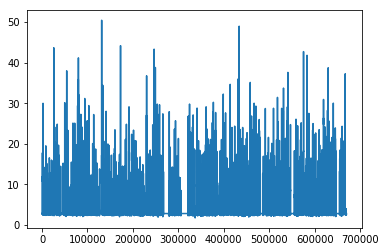

In [0]:
plt.plot(mse)
plt.show()

### Create  a list of tuples with start and end index for sequences w/ RMSE that exceed threshold

In [0]:
threshold = 30  # Establishes RMSE anomaly threshold

anomaly_ranges = detect_anomalies(mse, threshold = threshold, n_steps = n_steps)

###Plot Appliance Data and Highlight Anomalies

In [0]:
from bokeh.plotting import figure, output_file, show
from bokeh.io import output_notebook
from bokeh.models import DatetimeTickFormatter
from bokeh.io import curdoc
from bokeh.models.annotations import BoxAnnotation

output_notebook()
curdoc().theme = 'caliber'

p = figure(plot_width=1000, plot_height=600, x_axis_type="datetime")
p.xaxis.axis_label = "Time"
p.yaxis.axis_label = "Watts"

p.xaxis.formatter=DatetimeTickFormatter(
        hours=["%H"],
        days=["%d %B %Y"],
        months=["%d %B %Y"],
        years=["%d %B %Y"],
    )
p.xaxis.major_label_orientation = np.pi/4

x0 = dw.index
y0 = np.array(dw['Appliance'])


for i in range(len(anomaly_ranges)):
        start = anomaly_ranges[i][0]
        stop = anomaly_ranges[i][1]
        box = BoxAnnotation(left=dw.index[start], right=dw.index[stop],
                    line_width=0.1, line_color='black', line_dash=[], line_alpha = 0.0,
                    fill_alpha=0.1, fill_color='yellow')
        p.add_layout(box)

p.line(x0, y0, legend= "Dishwasher", line_color='dodgerblue')


show(p)

Loading BokehJS ...